# Model Evaluation and Model Comparision

importing Jupyter notebook from DSC630_ProjectMilestone3_DataPreperation_PreliminaryAnalysis.ipynb
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-nu

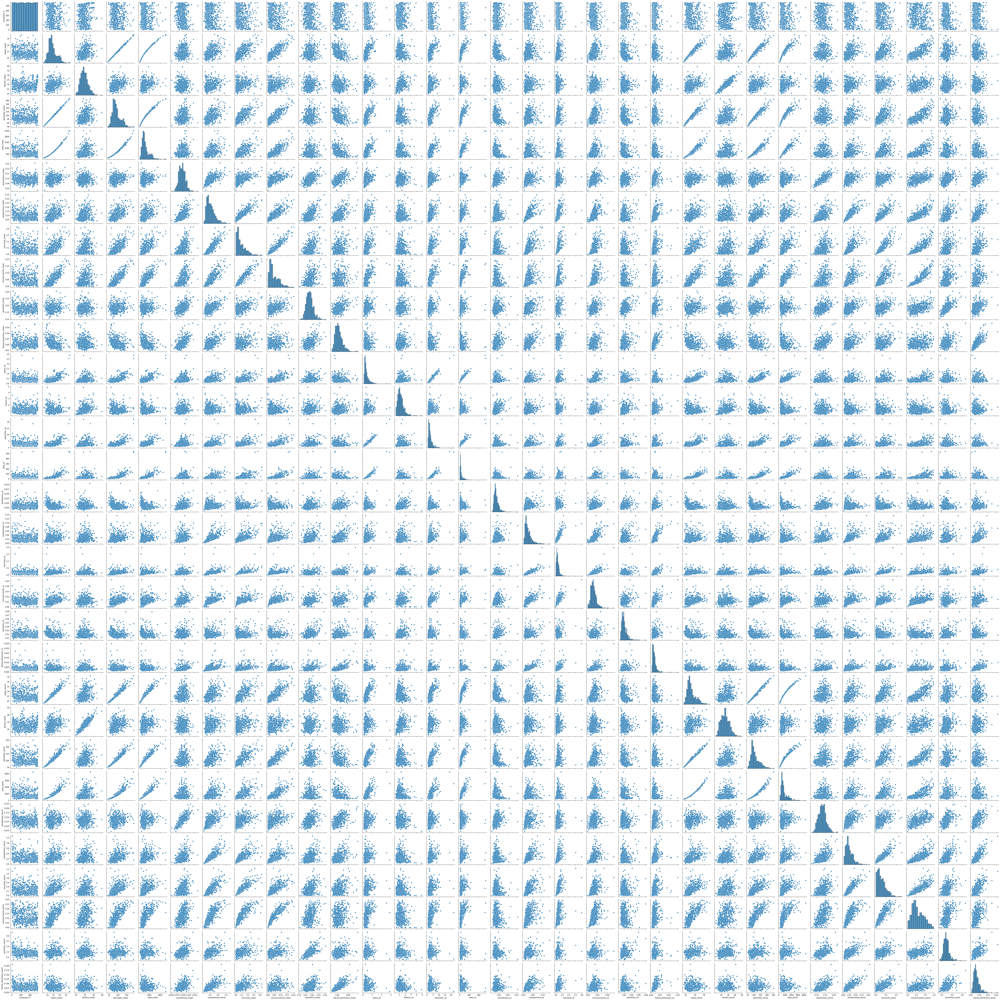

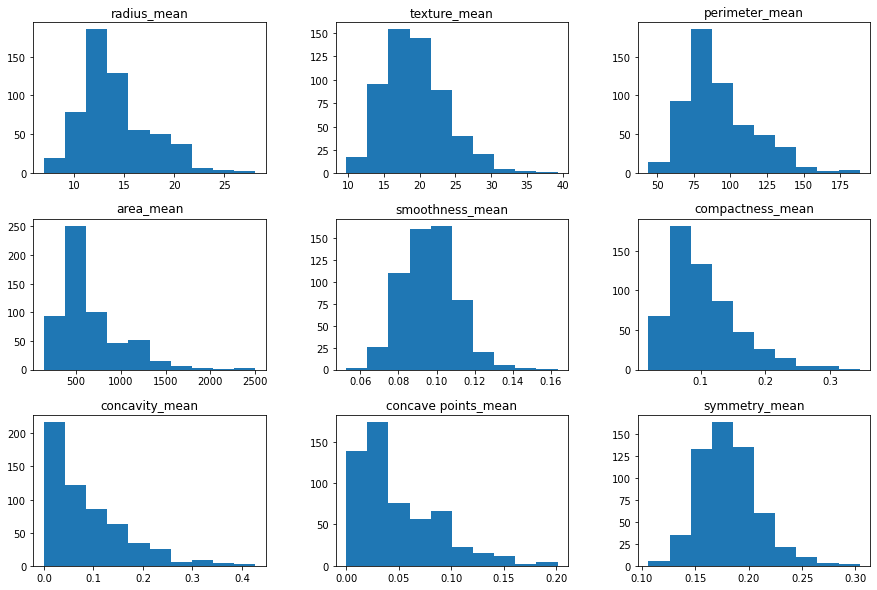

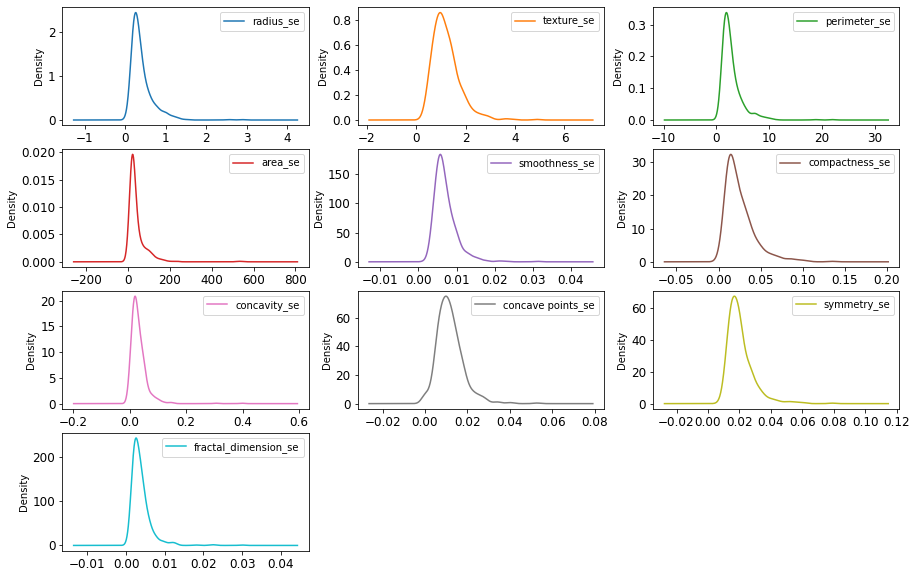

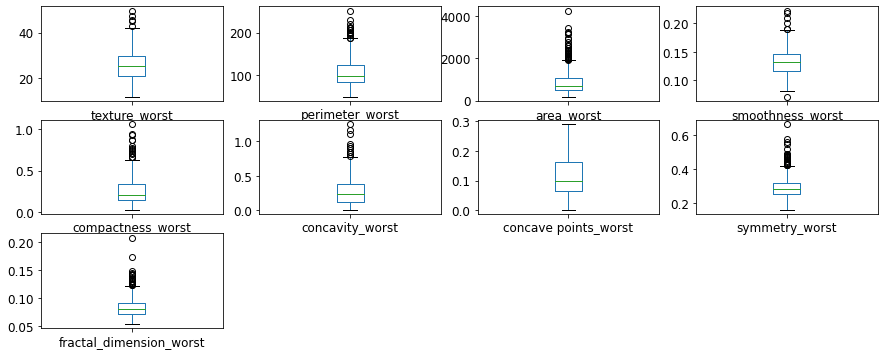

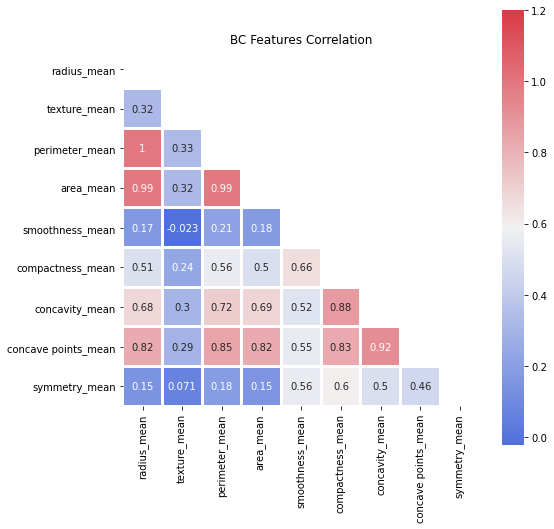

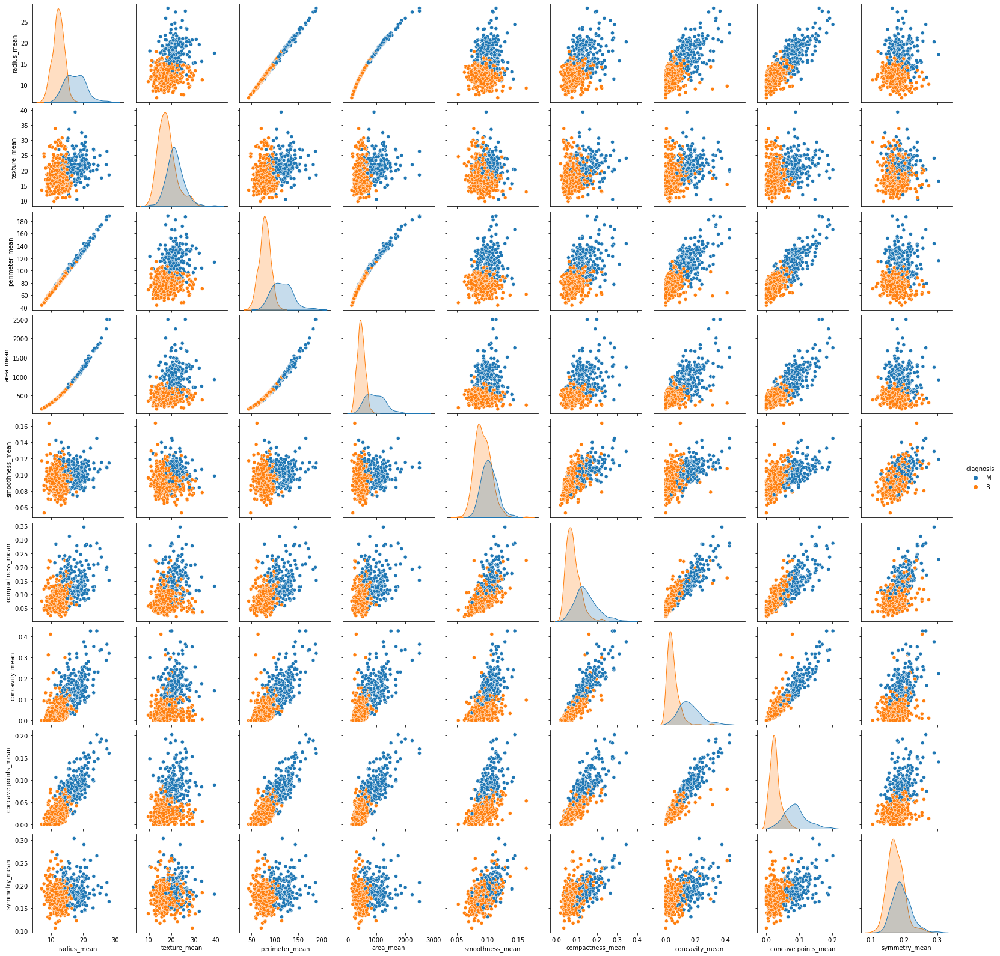

In [1]:
# Recap of Project from previous milestones
import import_ipynb
import DSC630_ProjectMilestone3_DataPreperation_PreliminaryAnalysis

# Principal Component Analysis(PCA)

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.model_selection import train_test_split,ShuffleSplit
import warnings
warnings.filterwarnings('ignore')

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

In [3]:
#Step 1: Load data into a dataframe
bc_df = "C:\BU\DSC630\project\data/data.csv"
data = pd.read_csv(bc_df)

In [4]:
categorical_map = {"M": 1, "B": 0}

data['diagnosis'] = data['diagnosis'].map(categorical_map)

In [5]:
tgt_pca = pd.DataFrame(data['diagnosis'])
data_pca = data.drop('diagnosis', axis=1)

#To perform PCA - the pre-requisite is to perform data normalization
X_pca = data_pca.values
X_std = StandardScaler().fit_transform(X_pca)

pca = PCA(svd_solver='full')
pca_std = pca.fit(X_std, tgt_pca).transform(X_std)

pca_std = pd.DataFrame(pca_std)
pca_std = pca_std.merge(tgt_pca, left_index = True, right_index = True, how = 'left')

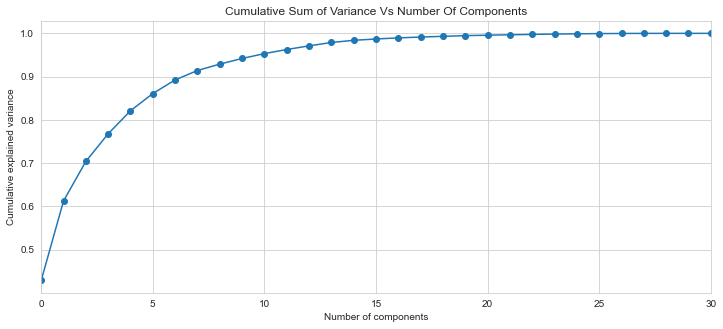

In [6]:
sns.set_style('whitegrid')
plt.figure(figsize=(12,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_),marker='o')
plt.xlim(0,30,1)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.title('Cumulative Sum of Variance Vs Number Of Components')
plt.show()

# Machine Learning Classification using Support Vector Machine(SVM)

In [7]:
#Preparing data for model building and valuation. 
# 40 percent of data is kept aside for validation purposes
X = data.drop('diagnosis',axis=1).values
y = data['diagnosis'].values

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = sc.fit_transform(X)

# train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=40)

In [8]:
from sklearn import metrics
def plot_confusion_metrix(y_test,model_test):
    cm = metrics.confusion_matrix(y_test, model_test)
    plt.figure(1)
    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Benign','Malignant']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()
    

In [9]:
from sklearn.metrics import roc_curve, auc
def report_performance(model):

    model_test = model.predict(X_test)

    print("\n\nConfusion Matrix:")
    print("{0}".format(metrics.confusion_matrix(y_test, model_test)))
    print("\n\nClassification Report: ")
    print(metrics.classification_report(y_test, model_test))
    #cm = metrics.confusion_matrix(y_test, model_test)
    plot_confusion_metrix(y_test, model_test)


In [10]:
from sklearn import metrics
def plot_roc_curve(model):
# calculate the fpr and tpr for all thresholds of the classification
    probs = model.predict_proba(X_test)
    preds = probs[:,1]
    fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
    roc_auc = metrics.auc(fpr, tpr)
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()


In [11]:
def accuracy(model):
    pred = model.predict(X_test)
    accuracy = metrics.accuracy_score(y_test,pred)
    print("=======================================")
    print("\n Accuracy Of the Model: ",accuracy,"\n\n\n")
    print("=======================================")

On linear kernel:


Confusion Matrix:
[[144   4]
 [  2  78]]


Classification Report: 
              precision    recall  f1-score   support

           0       0.99      0.97      0.98       148
           1       0.95      0.97      0.96        80

    accuracy                           0.97       228
   macro avg       0.97      0.97      0.97       228
weighted avg       0.97      0.97      0.97       228



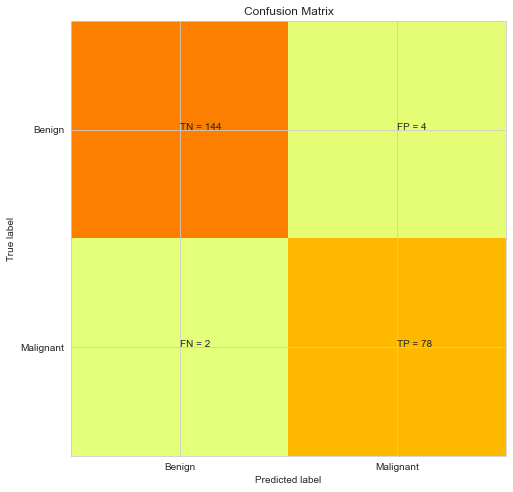

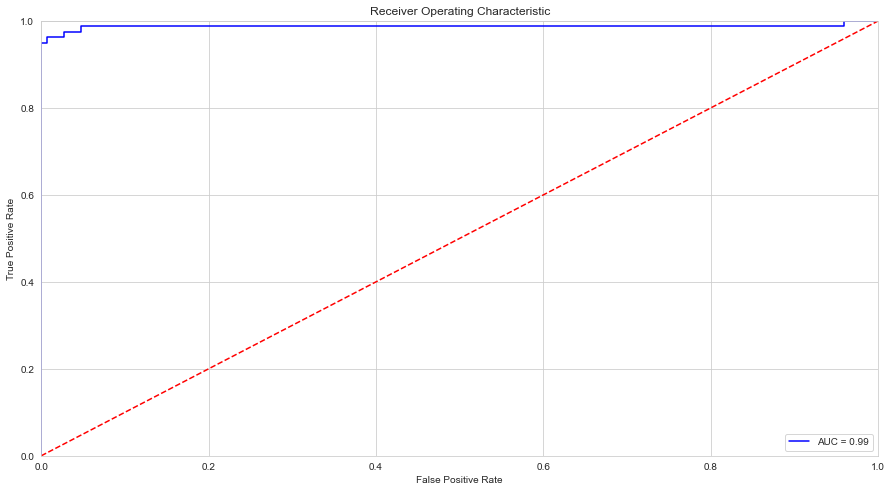


 Accuracy Of the Model:  0.9736842105263158 




 Accuracy Of the Model:  0.9736842105263158 



On rbf kernel:


Confusion Matrix:
[[147   1]
 [  1  79]]


Classification Report: 
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       148
           1       0.99      0.99      0.99        80

    accuracy                           0.99       228
   macro avg       0.99      0.99      0.99       228
weighted avg       0.99      0.99      0.99       228



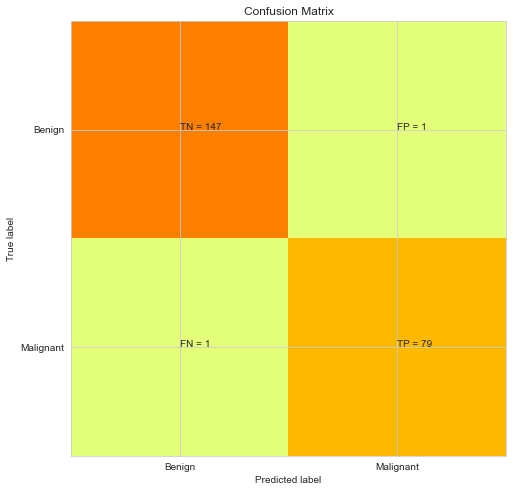

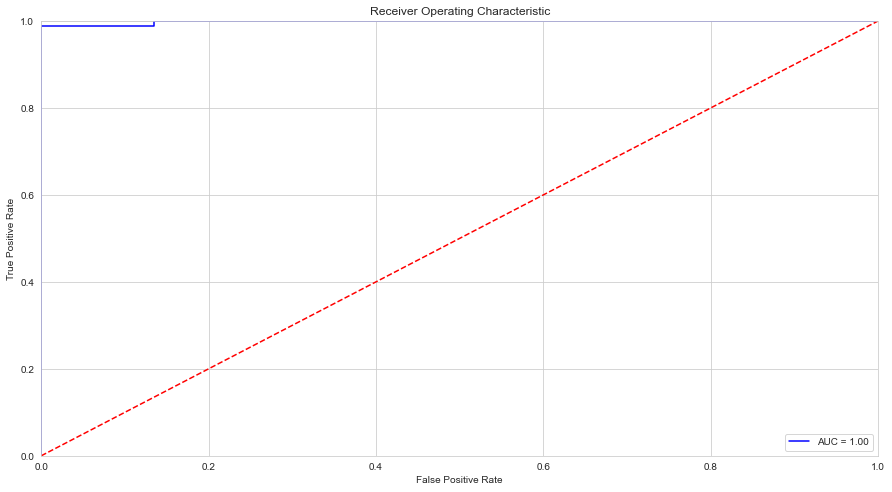


 Accuracy Of the Model:  0.9912280701754386 




 Accuracy Of the Model:  0.9912280701754386 





In [12]:
for i in ['linear','rbf']:
    clf = SVC(kernel=i,probability=True)
    clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    print("=======================================")
    print("On "+ i + " kernel:" )
    report_performance(clf)
    plot_roc_curve(clf)
    accuracy(clf)
    acc=accuracy(clf)
    

# Machine Learning Classification using Logistic regression

In [13]:
#frequency table
pd.crosstab(index = data['diagnosis'], columns = 'count')

col_0,count
diagnosis,
0,357
1,212


In [14]:
#Initializing the model
model_lr = LogisticRegression()

In [15]:
#Fitting the model for the train data
model_lr.fit(X_train, y_train)

LogisticRegression()

In [16]:
#Predicting for the unseen data
predict_lr = model_lr.predict(X_test)



Confusion Matrix:
[[146   2]
 [  2  78]]


Classification Report: 
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       148
           1       0.97      0.97      0.97        80

    accuracy                           0.98       228
   macro avg       0.98      0.98      0.98       228
weighted avg       0.98      0.98      0.98       228



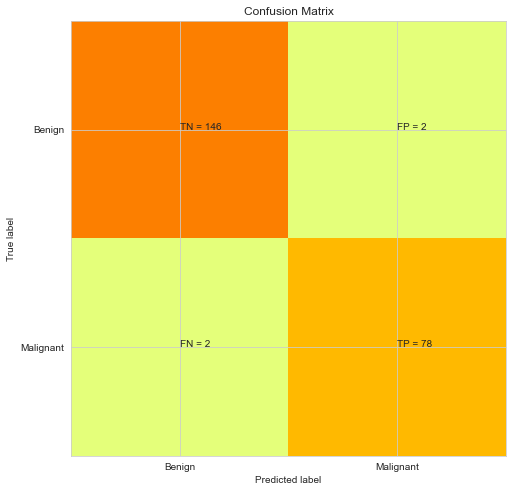

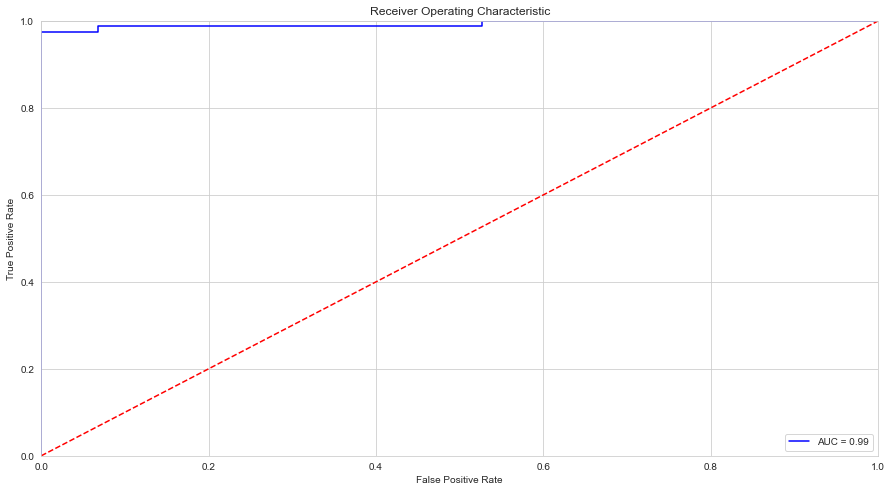


 Accuracy Of the Model:  0.9824561403508771 





In [17]:
report_performance(model_lr)
plot_roc_curve(model_lr)
accuracy(model_lr)


# Machine Learning Classification using Random Forest

In [18]:
#Initializing the model
model_rf = RandomForestClassifier()

In [19]:
#Fitting the model for the train data
model_rf.fit(X_train, y_train)

RandomForestClassifier()

In [20]:
#Predicting for the unseen/test data
predict_rf = model_rf.predict(X_test)



Confusion Matrix:
[[146   2]
 [  6  74]]


Classification Report: 
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       148
           1       0.97      0.93      0.95        80

    accuracy                           0.96       228
   macro avg       0.97      0.96      0.96       228
weighted avg       0.97      0.96      0.96       228



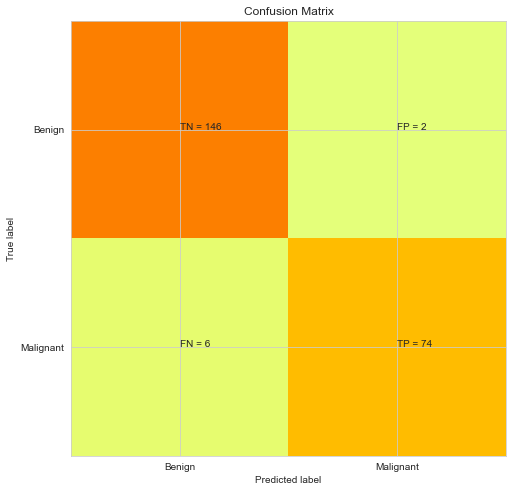

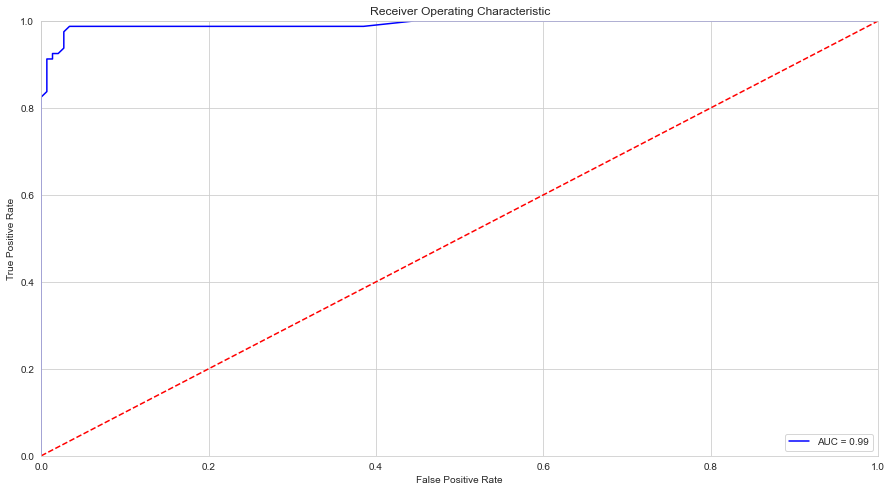


 Accuracy Of the Model:  0.9649122807017544 





In [21]:
report_performance(model_rf)
plot_roc_curve(model_rf)
accuracy(model_rf)

# Machine Learning Classification using KNN

In [22]:
#Initializing the model
model_knn = KNeighborsClassifier()

In [23]:
#Fitting the model for the train data
model_knn.fit(X_train, y_train)

KNeighborsClassifier()

In [24]:
#Predicting for the unseen/test data
predict_knn = model_knn.predict(X_test)



Confusion Matrix:
[[145   3]
 [  2  78]]


Classification Report: 
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       148
           1       0.96      0.97      0.97        80

    accuracy                           0.98       228
   macro avg       0.97      0.98      0.98       228
weighted avg       0.98      0.98      0.98       228



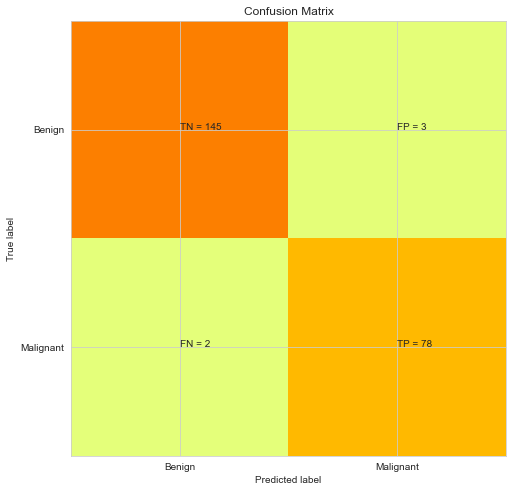

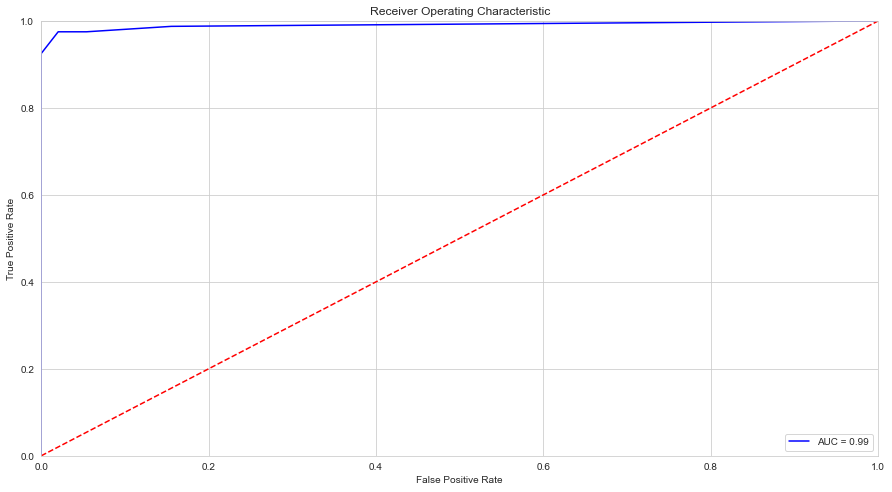


 Accuracy Of the Model:  0.9780701754385965 





In [25]:
report_performance(model_knn)
plot_roc_curve(model_knn)
accuracy(model_knn)

# Comparison of Machine Learning Classifications

Text(0.5, 1.0, 'Accuracies of Models')

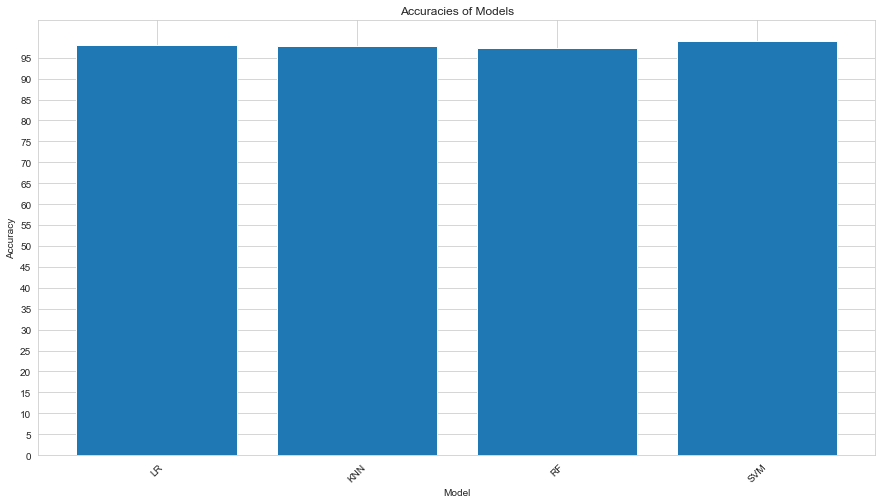

In [26]:
Index = [1,2,3,4]
name=["LR","KNN","RF","SVM"]
accuracy = [98,97.8,97.3,99]
plt.bar(Index,accuracy)
plt.xticks(Index, name, rotation=45)
plt.yticks(np.arange(0, 100, 5)) 
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models')